In [1]:
import numpy as np
import scipy as sp
from scipy import linalg
import matplotlib.pyplot as plt

In [2]:
#the time dependent hamiltonian is defined with 5 sites (N=2)
#in order to see whether or not there in an agreement with the
#effective hamiltonian in the high frequency regime

def hamiltonian(J, V, omega, t):
    H0 = np.array([[0, 1, 0, 0, 0],
                   [1, 0, 1, 0, 0],
                   [0, 1, 0, 1, 0],
                   [0, 0, 1, 0, 1],
                   [0, 0, 0, 1, 0],])
    
    Ha = np.array([[4, 0, 0, 0, 0],
                     [0, 1, 0, 0, 0],
                     [0, 0, 0, 0, 0],
                     [0, 0, 0, 1, 0],
                     [0, 0, 0, 0, 4],])
    
    ham = -J * H0 + V * np.cos(omega*t) * Ha
    return ham

In [3]:
#choice of the parameters
J = 0.5
Delta = 1
omega = 7

hamiltonian(1, 1, 0.5, 6)

array([[-3.95996999, -1.        ,  0.        ,  0.        ,  0.        ],
       [-1.        , -0.9899925 , -1.        ,  0.        ,  0.        ],
       [ 0.        , -1.        ,  0.        , -1.        ,  0.        ],
       [ 0.        ,  0.        , -1.        , -0.9899925 , -1.        ],
       [ 0.        ,  0.        ,  0.        , -1.        , -3.95996999]])

In [4]:
#initialization of the wave function in the middle of the lattice

psi0 = np.array([0, 0, 1, 0, 0])

In [5]:
#definition of the time evolution operator for the time-dependent hamiltonian

def U(dt, J, V, omega, t):
    val = sp.linalg.expm(-1j * dt * hamiltonian(J, V, omega, t))
    return val

In [6]:
dt = 0.01
U(dt, 1, 1, 0, 0)

array([[ 9.99150131e-01-3.99878345e-02j,  2.49957919e-04+9.99616703e-03j,
        -4.99900007e-05+8.33244171e-07j, -2.49979445e-09-1.66640835e-07j,
         4.16568062e-10-8.33247623e-12j],
       [ 2.49957919e-04+9.99616703e-03j,  9.99850015e-01-9.99850012e-03j,
         4.99954169e-05+9.99933337e-03j, -4.99970835e-05+3.33313334e-07j,
        -2.49979445e-09-1.66640835e-07j],
       [-4.99900007e-05+8.33244171e-07j,  4.99954169e-05+9.99933337e-03j,
         9.99900003e-01+3.33315001e-07j,  4.99954169e-05+9.99933337e-03j,
        -4.99900007e-05+8.33244171e-07j],
       [-2.49979445e-09-1.66640835e-07j, -4.99970835e-05+3.33313334e-07j,
         4.99954169e-05+9.99933337e-03j,  9.99850015e-01-9.99850012e-03j,
         2.49957919e-04+9.99616703e-03j],
       [ 4.16568062e-10-8.33247623e-12j, -2.49979445e-09-1.66640835e-07j,
        -4.99900007e-05+8.33244171e-07j,  2.49957919e-04+9.99616703e-03j,
         9.99150131e-01-3.99878345e-02j]])

In [7]:
#creation of the time list

t_start = 0
t_stop = 40
dt = 0.001
t_drive_list = np.arange(t_start,t_stop,dt) # Time list

In [8]:
#time evolution of the wave function

psit_drive = []
psit_eff = []
psi = psi0 # Initial state
psit_drive.append(psi0)

for t in t_drive_list[1:]:
    psi = np.dot(U(dt, J, Delta, omega, t), psi) # Apply the time evolution operator (Trotter)
    psit_drive.append(psi)

In [9]:
print(t_drive_list)

[0.0000e+00 1.0000e-03 2.0000e-03 ... 3.9997e+01 3.9998e+01 3.9999e+01]


In [10]:
print(psit_drive)

[array([0, 0, 1, 0, 0]), array([-1.24999773e-07+2.08328041e-10j,  2.49993802e-07+4.99999854e-04j,
        9.99999750e-01+8.33312771e-11j,  2.49993802e-07+4.99999854e-04j,
       -1.24999773e-07+2.08328041e-10j]), array([-4.99996376e-07+1.66652180e-09j,  9.99919210e-07+9.99998833e-04j,
        9.99999000e-01+6.66625367e-10j,  9.99919210e-07+9.99998833e-04j,
       -4.99996376e-07+1.66652180e-09j]), array([-1.12498165e-06+5.62401303e-09j,  2.24963886e-06+1.49999606e-03j,
        9.99997750e-01+2.24974738e-09j,  2.24963886e-06+1.49999606e-03j,
       -1.12498165e-06+5.62401303e-09j]), array([-1.99994203e-06+1.33294411e-08j,  3.99894015e-06+1.99999067e-03j,
        9.99996000e-01+5.33238744e-09j,  3.99894015e-06+1.99999067e-03j,
       -1.99994203e-06+1.33294411e-08j]), array([-3.12485851e-06+2.60303000e-08j,  6.24753527e-06+2.49998178e-03j,
        9.99993750e-01+1.04139855e-08j,  6.24753527e-06+2.49998178e-03j,
       -3.12485851e-06+2.60303000e-08j]), array([-4.49970669e-06+4.49725855e-

In [11]:
#calculation of the amplitudes and the probabilities

pos2 = [(psi[2]) for psi in psit_drive]
pos0 = [(psi[0]) for psi in psit_drive]
pos1 = [(psi[1]) for psi in psit_drive]


pos2_p = [np.abs(psi[2])**2 for psi in psit_drive]
pos0_p = [np.abs(psi[0])**2 for psi in psit_drive]
pos1_p = [np.abs(psi[1])**2 for psi in psit_drive]

/home/sdruci/anaconda3/lib/python3.11/site-packages/matplotlib/cbook/__init__.py:1340: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


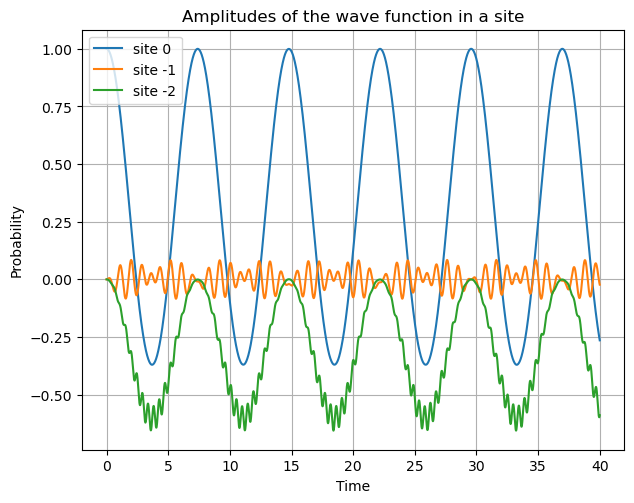

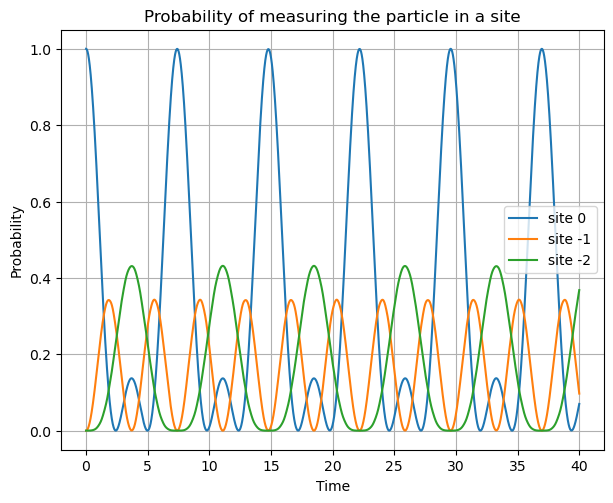

In [12]:
#plotting

plt.figure(figsize=(7,12))
plt.subplot(2,1,1)

plt.plot(t_drive_list, pos2, label="site {}".format(0))
plt.plot(t_drive_list, pos1, label="site {}".format(-1))
plt.plot(t_drive_list, pos0, label="site {}".format(-2))

plt.xlabel('Time')
plt.ylabel('Probability')
plt.title('Amplitudes of the wave function in a site')
plt.legend()
plt.grid(True)


plt.figure(figsize=(7,12))
plt.subplot(2,1,2)

plt.plot(t_drive_list, pos2_p, label="site {}".format(0))
plt.plot(t_drive_list, pos1_p, label="site {}".format(-1))
plt.plot(t_drive_list, pos0_p, label="site {}".format(-2))

plt.xlabel('Time')
plt.ylabel('Probability')
plt.title('Probability of measuring the particle in a site')
plt.legend()
plt.grid(True)

In [13]:
#the effective hamiltonian is defined with 5 sites (N=2)
#in order to see whether or not there in an agreement with the
#time dependent hamiltonian in the high frequency regime

def h_eff(J, V, omega):
    H0 = np.array([[0, 1, 0, 0, 0],
                   [1, 0, 1, 0, 0],
                   [0, 1, 0, 1, 0],
                   [0, 0, 1, 0, 1],
                   [0, 0, 0, 1, 0]])
    
    Ha = np.array([[0, 9, 0, 0, 0],
                     [9, 0, 1, 0, 0],
                     [0, 1, 0, 1, 0],
                     [0, 0, 1, 0, 9],
                     [0, 0, 0, 9, 0]])
    
    ham = -J * H0 + V**2 * J/(4 * omega**2) * Ha
    return ham

In [14]:
#time evolution operator for the time independent hamiltonian

def U_eff(J, V, omega, t):
    val = sp.linalg.expm(-1j * h_eff(J, V, omega) * t)
    return val

In [15]:
#time evolution of the wave function

psit_eff = []
psieff = psi0
psit_eff.append(psi0)

for t in t_drive_list[1:]:
    psieff = np.dot(U_eff(J, Delta, omega, t), psi0) # Effective dynamics
    psit_eff.append(psieff)

In [16]:
print(psit_eff)

[array([0, 0, 1, 0, 0]), array([-1.18651727e-07+0.j        ,  0.00000000e+00+0.00049745j,
        9.99999753e-01+0.j        ,  0.00000000e+00+0.00049745j,
       -1.18651727e-07+0.j        ]), array([-4.7460682e-07+0.j       ,  0.0000000e+00+0.0009949j,
        9.9999901e-01+0.j       ,  0.0000000e+00+0.0009949j,
       -4.7460682e-07+0.j       ]), array([-1.06786502e-06+0.j        ,  0.00000000e+00+0.00149235j,
        9.99997773e-01+0.j        ,  0.00000000e+00+0.00149235j,
       -1.06786502e-06+0.j        ]), array([-1.89842591e-06+0.j        ,  0.00000000e+00+0.00198979j,
        9.99996041e-01+0.j        ,  0.00000000e+00+0.00198979j,
       -1.89842591e-06+0.j        ]), array([-2.96628888e-06+0.j        ,  0.00000000e+00+0.00248724j,
        9.99993814e-01+0.j        ,  0.00000000e+00+0.00248724j,
       -2.96628888e-06+0.j        ]), array([-4.27145315e-06+0.j        ,  0.00000000e+00+0.00298468j,
        9.99991092e-01+0.j        ,  0.00000000e+00+0.00298468j,
       -4.27145

In [17]:
#calculation of the amplitudes and the probabilities of certain sites

pos2eff = [(psi[2]) for psi in psit_eff]
pos0eff = [(psi[0]) for psi in psit_eff]
pos1eff = [(psi[1]) for psi in psit_eff]

pos2eff_p = [np.abs(psi[2])**2 for psi in psit_eff]
pos0eff_p = [np.abs(psi[0])**2 for psi in psit_eff]
pos1eff_p = [np.abs(psi[1])**2 for psi in psit_eff]


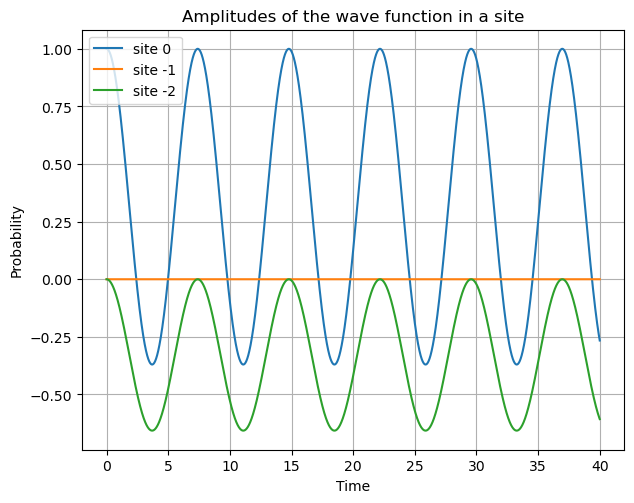

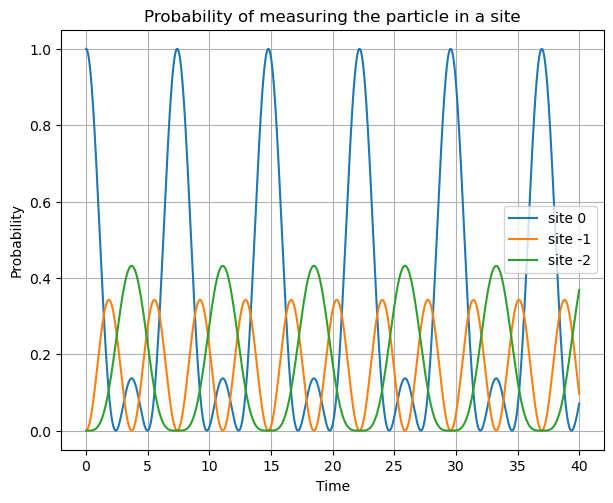

In [18]:
#plotting

plt.figure(figsize=(7,12))
plt.subplot(2,1,1)
plt.plot(t_drive_list, pos2eff, label= "site {}".format(0))
plt.plot(t_drive_list, pos1eff, label= "site {}".format(-1))
plt.plot(t_drive_list, pos0eff, label= "site {}".format(-2))


plt.xlabel('Time')
plt.ylabel('Probability')
plt.title('Amplitudes of the wave function in a site')
plt.legend()
plt.grid(True)


plt.figure(figsize=(7,12))
plt.subplot(2,1,2)
plt.plot(t_drive_list, pos2eff_p, label= "site {}".format(0))
plt.plot(t_drive_list, pos1eff_p, label= "site {}".format(-1))
plt.plot(t_drive_list, pos0eff_p, label= "site {}".format(-2))


plt.xlabel('Time')
plt.ylabel('Probability')
plt.title('Probability of measuring the particle in a site')
plt.legend()
plt.grid(True)


In [19]:
#now i define the effective hamiltonian as a function of N 
#in order to define the hamiltonian for a bigger lattice

def hamiltonian_ho(N):
    size = 2*N + 1
    matrix = np.zeros((size, size), dtype=float)
    
    for n in range(-N, N):
        matrix[n + N, n + N + 1] = 1
        matrix[n + N + 1, n + N] = 1
        
    return matrix


def hamiltonian_matrix(N):
    size = 2*N + 1
    matrix = np.zeros((size, size), dtype=float)
    
    for n in range(-N, N):
        element = (2*n + 1)**2
        matrix[n + N, n + N + 1] = element
        matrix[n + N + 1, n + N] = element
        
    return matrix


def h_eff_ext(J, V, omega, N):
    
    H0 = hamiltonian_ho(N)
    Ha = hamiltonian_matrix(N)
    
    ham = -J * H0 + V**2 * J/(4 * omega**2) * Ha
    return ham


In [20]:
#time evolution operator

def U_eff_ext(J, V, omega, N, t):
    val = sp.linalg.expm(-1j * h_eff_ext(J, V, omega, N) * t)
    return val

[-16072.52498049+0.j -16066.08960904+0.j -16059.65552479+0.j ...
    -19.94293541+0.j    -19.94356807+0.j    -19.94394883+0.j]
[-11086.60135503+0.j -11082.16083854+0.j -11077.72121025+0.j ...
    -19.49588952+0.j    -19.49737238+0.j    -19.49826181+0.j]


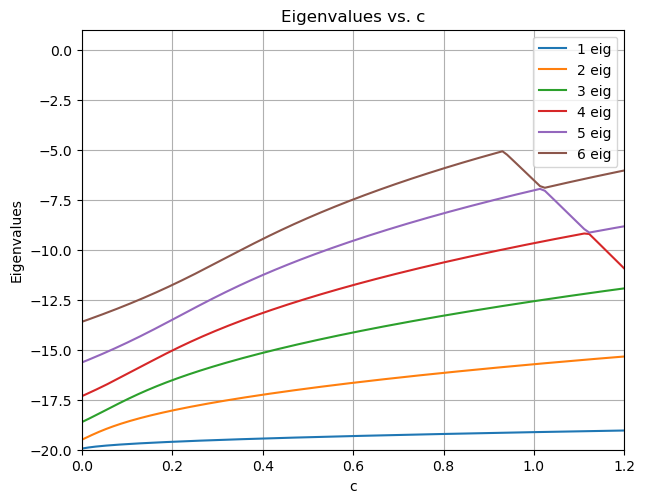

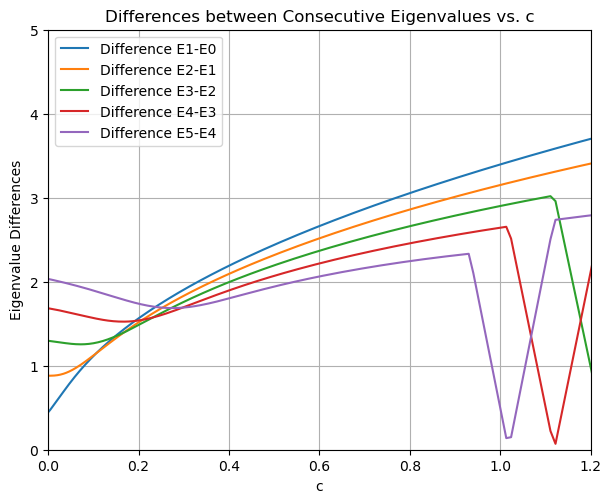

In [21]:
#Eigenvalues and eigenvector computation 

J = 10
epsilon =  0.003
num_iterations =  5000 

Delta_initial = 15
omega = 9

#initialize list to store eigenvalues
all_eigenvalues = []
all_eigenvectors = []

Delta = Delta_initial
smallest_eigenvalues = []
smallest_eigenvectors = []

second_smallest_eigenvalues = []
third_smallest_eigenvalues = []
fourth_smallest_eigenvalues = []
fifth_smallest_eigenvalues = []
sixth_smallest_eigenvalues = []


for _ in range(num_iterations):
    matrix = h_eff_ext(J, Delta, omega, 20)
    
    #calculate eigenvalues
    eigenvalues, eigenvectors = np.linalg.eig(matrix)
    
    #store eigenvalues for this value of delta
    all_eigenvalues.append(eigenvalues)
    all_eigenvectors.append(eigenvectors)

    indices = np.argsort(eigenvalues)
    small_val = eigenvalues[indices[0]]

    smallest_eigenvalues.append(small_val)

    index_smallest_eigenvalue = np.argmin(eigenvalues)
    small_vec = eigenvectors[:, index_smallest_eigenvalue]
    smallest_eigenvectors.append(small_vec)
    
    #store the eigenvalues and eigenvectors for the second smallest eigenvalue
    second_smallest_eigenvalues.append(eigenvalues[indices[2]])
    
    #store the eigenvalues and eigenvectors for the third smallest eigenvalue
    third_smallest_eigenvalues.append(eigenvalues[indices[4]])
    fourth_smallest_eigenvalues.append(eigenvalues[indices[6]])
    fifth_smallest_eigenvalues.append(eigenvalues[indices[8]])
    sixth_smallest_eigenvalues.append(eigenvalues[indices[10]])


    #decrease Delta by epsilon
    Delta -= epsilon

#convert list to numpy array for easier manipulation
all_eigenvalues = np.array(all_eigenvalues)
all_eigenvectors = np.array(all_eigenvectors)
smallest_eigenvalues = np.array(smallest_eigenvalues)
smallest_eigenvectors = np.array(smallest_eigenvectors)

second_smallest_eigenvalues = np.array(second_smallest_eigenvalues)
third_smallest_eigenvalues = np.array(third_smallest_eigenvalues)
fourth_smallest_eigenvalues = np.array(fourth_smallest_eigenvalues)
fifth_smallest_eigenvalues = np.array(fifth_smallest_eigenvalues)
sixth_smallest_eigenvalues = np.array(sixth_smallest_eigenvalues)

print(smallest_eigenvalues)
print(second_smallest_eigenvalues)

# Plot eigenvalues vs. Delta
plt.figure(figsize=(7,12))
plt.subplot(2,1,1)

c = (np.arange(Delta_initial, Delta_initial - num_iterations * epsilon, -epsilon)**2 )*J/(4* omega**2) * 100


plt.plot(c, smallest_eigenvalues, label=f"1 eig")
plt.plot(c, second_smallest_eigenvalues, label=f"2 eig")
plt.plot(c, third_smallest_eigenvalues, label=f"3 eig")
plt.plot(c, fourth_smallest_eigenvalues, label=f"4 eig")
plt.plot(c, fifth_smallest_eigenvalues, label=f"5 eig")
plt.plot(c, sixth_smallest_eigenvalues, label=f"6 eig")


plt.xlabel('c')
plt.ylabel('Eigenvalues')
plt.xlim(0,1.2)
plt.ylim(-20,1)
plt.title('Eigenvalues vs. c')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(7,12))
plt.subplot(2,1,2)

#calculate the differences between consecutive eigenvalues for each Delta value
diff1 = second_smallest_eigenvalues - smallest_eigenvalues
diff2 = third_smallest_eigenvalues - second_smallest_eigenvalues
diff3 = fourth_smallest_eigenvalues - third_smallest_eigenvalues
diff4 = fifth_smallest_eigenvalues - fourth_smallest_eigenvalues
diff5 = sixth_smallest_eigenvalues - fifth_smallest_eigenvalues

plt.plot(c, diff1, label='Difference E1-E0')
plt.plot(c, diff2, label='Difference E2-E1')
plt.plot(c, diff3, label='Difference E3-E2')
plt.plot(c, diff4, label='Difference E4-E3')
plt.plot(c, diff5, label='Difference E5-E4')

plt.xlabel('c')
plt.ylabel('Eigenvalue Differences')
plt.xlim(0,1.2)
plt.ylim(0,5)
plt.title('Differences between Consecutive Eigenvalues vs. c')
plt.legend()
plt.grid(True)
plt.show()


0.23811761799581313


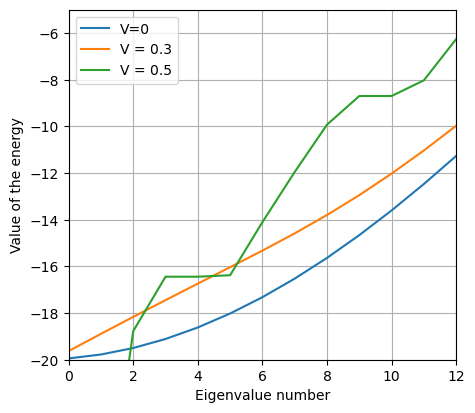

In [22]:
#plotting another visualization with different deltas

#Delta = 0
Delta = 0

matrix = h_eff_ext(J, Delta, omega, 20)

eigenvalues, eigenvectors = np.linalg.eig(matrix)

eigenvalues = np.sort(eigenvalues)

plt.figure(figsize=(5,10))
plt.subplot(2,1,1)
plt.plot(np.arange(0,41), eigenvalues, label="V=0")


#Delta = 0.3
c = 0.175
Delta = np.sqrt((4 * omega**2 * c)/(J*100))
print(Delta)

matrix = h_eff_ext(J, Delta, omega, 20)

eigenvalues, eigenvectors = np.linalg.eig(matrix)

eigenvalues = np.sort(eigenvalues)
plt.plot(np.arange(0,41), eigenvalues, label ="V = 0.3")
plt.xlabel("Eigenvalue number")
plt.ylabel("Value of the energy")


#Delta = 0.8
Delta = 0.8

matrix = h_eff_ext(J, Delta, omega, 20)

eigenvalues, eigenvectors = np.linalg.eig(matrix)

eigenvalues = np.sort(eigenvalues)
plt.plot(np.arange(0,41), eigenvalues, label="V = 0.5")

plt.legend()
plt.xlim(0,12)
plt.ylim(-20,-5)
plt.grid(True)

In [23]:
from scipy.fft import fft, fftfreq
import matplotlib.pyplot as plt

In [24]:
def h(J, V, omega, N, t):
    H0 = np.diag(np.ones(2 * N), k=1) + np.diag(np.ones(2 * N), k=-1)
    
    H_pot = np.zeros((2*N + 1, 2*N + 1), dtype=float)
    
    for n in range(-N, N + 1):
        H_pot[n + N, n + N] = n**2
            
    ham = -J * H0 + V * np.cos(omega*t) * H_pot
    return ham

def h_eff(J, V, omega, N):
    H0 = np.diag(np.ones(2 * N), k=1) + np.diag(np.ones(2 * N), k=-1)
    
    H_pot = np.zeros((2*N + 1, 2 * N + 1), dtype=float)
    
    for n in range(-N, N):
        H_pot[n + N, n + N + 1] = (2*n + 1)**2
        H_pot[n + N + 1, n + N] = (2*n + 1)**2
            
    ham = -J * H0 + V**2 * J/(4 * omega**2) * H_pot
    
    return ham

In [25]:
import numpy as np
import scipy as sp

def U(dt, J, V, omega, N, t_list, psi0):
    evolution = []
    psi = psi0 / np.linalg.norm(psi0) 
    evolution.append(psi)

    for t in t_list[1:]:
        psi = np.dot(sp.linalg.expm(-1j * dt * h(J, V, omega, N, t)), psi)  # Apply the time evolution operator (Trotter)
        psi /= np.linalg.norm(psi) 
        evolution.append(psi)

    return evolution

def U_eff(J, V, omega, N, t_list, psi0):
    evolution = []
    psi0 /= np.linalg.norm(psi0) 
    evolution.append(psi0)

    for t in t_list[1:]:
        psieff = np.dot(sp.linalg.expm(-1j * h_eff(J, V, omega, N) * t), psi0)  # Effective dynamics
        psieff /= np.linalg.norm(psieff) 
        evolution.append(psieff)

    return evolution

In [26]:
def wave_packet(mu, sigma, num_sites):
    x = np.arange(-num_sites, num_sites+1)
    return np.exp(-(x - mu)**2 / (2 * sigma**2)) / np.sqrt(np.sqrt(np.pi) * sigma)

In [68]:
J = 10
V = 0.3
Omega = 9
N = 20

t_start = 0
t_stop = 15
dt = 0.001
t_list = np.arange(t_start,t_stop,dt) # Time list

mu = 0.5
sigma = 5
psi0 = wave_packet(mu, sigma, N)

In [69]:
real_evolution = U(dt, J, V, Omega, N, t_list, psi0)
eff_evolution = U_eff(J, V, Omega, N, t_list, psi0)

/home/sdruci/anaconda3/lib/python3.11/site-packages/matplotlib/cbook/__init__.py:1340: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


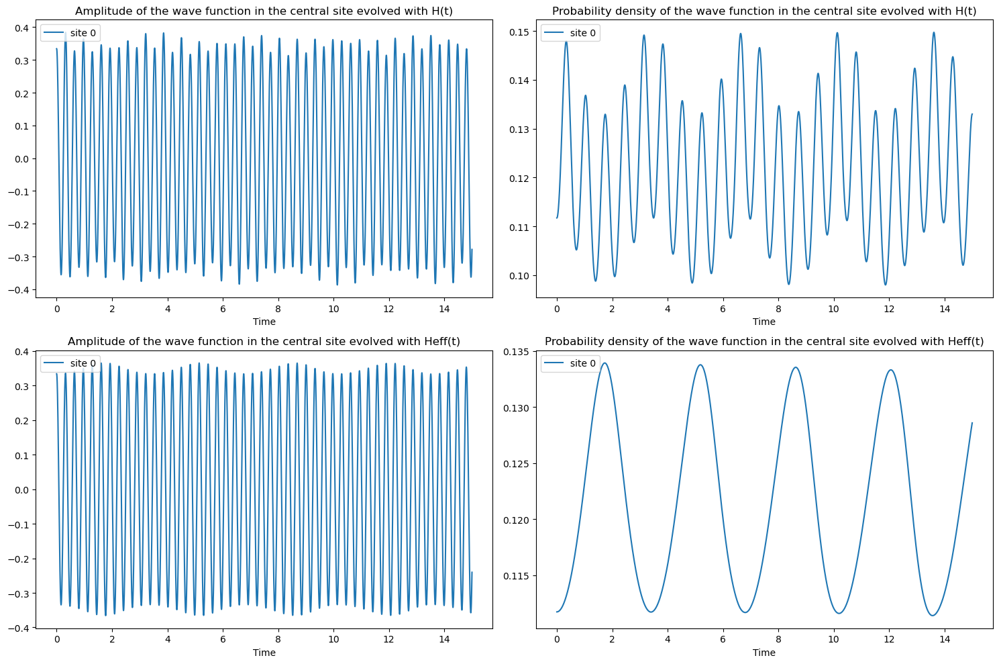

In [70]:
fig = plt.figure(figsize=(15, 10))

ax1 = plt.subplot(2, 2, 1)
ax2 = plt.subplot(2, 2, 2)
ax3 = plt.subplot(2, 2, 3)
ax4 = plt.subplot(2, 2, 4)

for i in range(N,N+1):
    ax1.plot(t_list, [psi[i] for psi in real_evolution], label=f'site {-N + i}')
    ax2.plot(t_list, [(np.abs(psi[i]))**2 for psi in real_evolution], label=f'site {-N + i}')
    ax3.plot(t_list, [psi[i] for psi in eff_evolution], label=f'site {-N + i}')
    ax4.plot(t_list, [(np.abs(psi[i]))**2 for psi in eff_evolution], label=f'site {-N + i}')

ax1.legend(loc= 'upper left')
ax2.legend(loc= 'upper left')
ax3.legend(loc= 'upper left')
ax4.legend(loc= 'upper left')

ax1.set_title('Amplitude of the wave function in the central site evolved with H(t)')
ax3.set_title('Amplitude of the wave function in the central site evolved with Heff(t)')
ax2.set_title('Probability density of the wave function in the central site evolved with H(t)')
ax4.set_title('Probability density of the wave function in the central site evolved with Heff(t)')

for ax in [ax1, ax2, ax3, ax4]:
    ax.set_xlabel('Time')


plt.tight_layout()
plt.show()

In [71]:
def calculate_frequency_from_central_site(t_list, evolved_state):
    # Convert the list of arrays to a NumPy array
    evolved_state_array = np.array(evolved_state)

    # Select the central site (position 0) for analysis
    central_site_wavefunction = evolved_state_array[:, N]

    # Calculate the Fourier Transform
    central_site_fft = fft(central_site_wavefunction)

    # Frequency axis
    dt = t_list[1] - t_list[0]
    freqs = fftfreq(len(central_site_wavefunction), dt)

    # Shift the zero frequency component to the center
    central_site_fft_shifted = np.fft.fftshift(central_site_fft)
    freqs_shifted = np.fft.fftshift(freqs)

    # Find the positive frequency with maximum amplitude
    positive_freqs_shifted = freqs_shifted[freqs_shifted >= 0]
    positive_amplitudes = np.abs(central_site_fft_shifted[freqs_shifted >= 0])
    max_freq_index = np.argmax(positive_amplitudes)
    max_frequency = positive_freqs_shifted[max_freq_index]

    return max_frequency

# Assuming real_evolution is a list of arrays with shape (time_steps, num_sites)
# Calculate frequency from the already evolved state
max_frequency_real = calculate_frequency_from_central_site(t_list, real_evolution)
max_frequency_eff = calculate_frequency_from_central_site(t_list, eff_evolution)

print('H:')
print(f'The estimated frequency of oscillation at the central site is: {max_frequency_real} Hz')
print(f'The estimated period of oscillation at the central site is: {2*np.pi/max_frequency_real} s\n')

print('H_eff:')
print(f'The estimated frequency of oscillation at the central site is: {max_frequency_eff} Hz')
print(f'The estimated period of oscillation at the central site is: {2*np.pi/max_frequency_eff} s')

H:
The estimated frequency of oscillation at the central site is: 3.1333333333333333 Hz
The estimated period of oscillation at the central site is: 2.0052719065466764 s

H_eff:
The estimated frequency of oscillation at the central site is: 3.1333333333333333 Hz
The estimated period of oscillation at the central site is: 2.0052719065466764 s


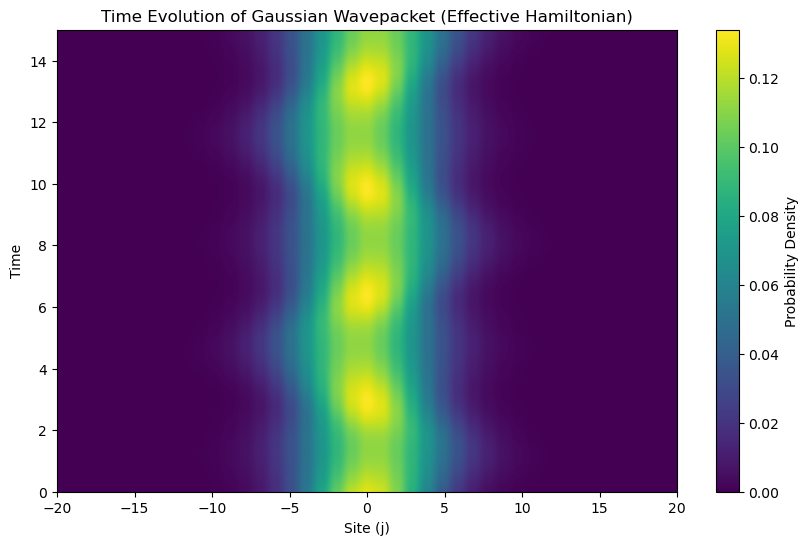

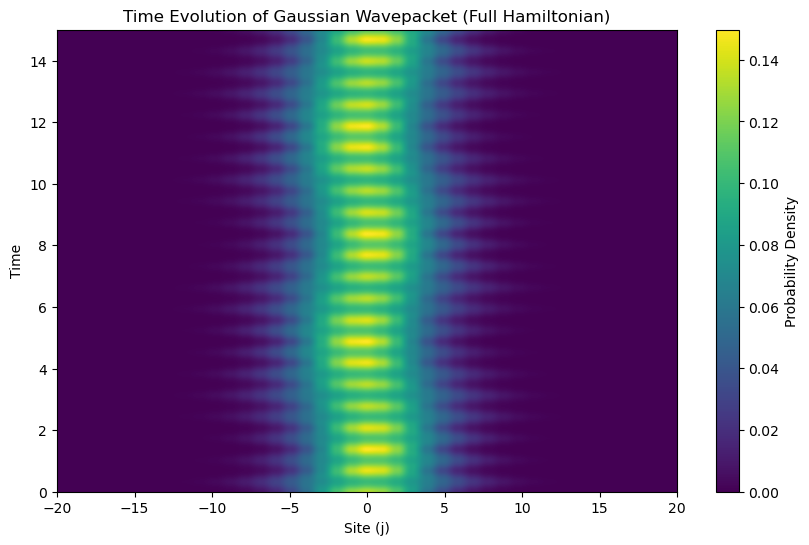

In [72]:
# Plot the results
plt.figure(figsize=(10, 6))
plt.imshow(np.abs(eff_evolution)**2, extent=[-N, N, 0, len(t_list) * dt], aspect='auto', cmap='viridis')
plt.colorbar(label='Probability Density')
plt.title('Time Evolution of Gaussian Wavepacket (Effective Hamiltonian)')
plt.xlabel('Site (j)')
plt.ylabel('Time')
plt.show()

plt.figure(figsize=(10, 6))
plt.imshow(np.abs(real_evolution)**2, extent=[-N, N, 0, len(t_list) * dt], aspect='auto', cmap='viridis')
plt.colorbar(label='Probability Density')
plt.title('Time Evolution of Gaussian Wavepacket (Full Hamiltonian)')
plt.xlabel('Site (j)')
plt.ylabel('Time')
plt.show()

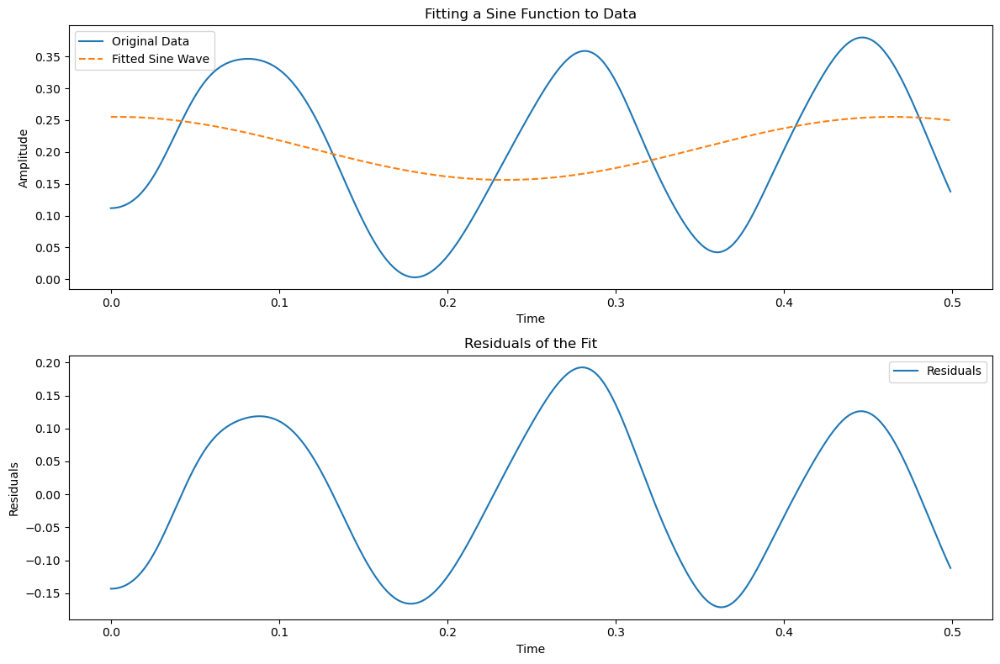

Fitted parameters: A = 0.049496996540199, f = 2.1699172621812215, phi = -4.76209196425011, C = 0.20557570682206108
Period: T = 0.46084706427690725
Chi-squared value: 5.9485375849788955


In [56]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Define a sine function
def sine_function(t, A, f, phi, C):
    return A * np.sin(2 * np.pi * f * t + phi) + C

# Assuming real_evolution is a list of arrays with shape (time_steps, num_sites)
# Select the central site (position 0) for analysis
central_site_wavefunction = np.array(real_evolution)[:, N]

# Create a time array
t = t_list

# Initial guess for the parameters
initial_guess = [0.1, 0.3, 0.0, 0.112]  # A, f, phi, C

# Perform the curve fit
params, covariance = curve_fit(sine_function, t, (np.abs(central_site_wavefunction))**2, p0=initial_guess)

# Extract the fitted parameters
A_fit, f_fit, phi_fit, C_fit = params

# Generate the fitted sine wave
fitted_sine_wave = sine_function(t, A_fit, f_fit, phi_fit, C_fit)

# Calculate residuals
residuals = (np.abs(central_site_wavefunction))**2 - fitted_sine_wave

# Calculate chi-squared value
chi_squared = np.sum(residuals**2)

# Plot the original data, the fitted sine wave, and the residuals
plt.figure(figsize=(12, 8))

plt.subplot(2, 1, 1)
plt.plot(t, (np.abs(central_site_wavefunction))**2, label='Original Data')
plt.plot(t, fitted_sine_wave, label='Fitted Sine Wave', linestyle='--')
plt.title('Fitting a Sine Function to Data')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.legend()

plt.subplot(2, 1, 2)
plt.plot(t, residuals, label='Residuals')
plt.title('Residuals of the Fit')
plt.xlabel('Time')
plt.ylabel('Residuals')
plt.legend()

plt.tight_layout()
plt.show()

print(f'Fitted parameters: A = {A_fit}, f = {f_fit}, phi = {phi_fit}, C = {C_fit}')
print(f'Period: T = {1/f_fit}')
print(f'Chi-squared value: {chi_squared}')